In [1]:
import torch as tch
import torch.nn.functional as F
import torch.nn as tchnn
import torch.autograd as tchagd
import torch.optim as tchoptim
from torch.autograd import Variable
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
import random
import visdom

In [2]:
#params for the system
e_inp_dim = 28*28
e_out_dim = 100 #z, latent variable
d_inp_dim = 100
d_out_dim = 28*28
n_hidden = 512
BATCHSZ = 64*2

In [3]:
#visdom client
vis = visdom.Visdom(port=7777)

In [3]:
#encoder network (X -> z)
class Encoder(tchnn.Module):
	def __init__(self):
		super(Encoder, self).__init__()
		self.L1 = tchnn.Linear(e_inp_dim, n_hidden)
		#self.L2 = tchnn.Linear(n_hidden, n_hidden)
		self.Ou = tchnn.Linear(n_hidden, e_out_dim) #for mu and sigma 
		self.L3 = tchnn.Linear(e_out_dim, e_out_dim)#for mu
		self.L4 = tchnn.Linear(e_out_dim, e_out_dim)#for sigma
	
	def forward(self, x):
		x = F.relu(self.L1(x))
		#x = F.relu(self.L2(x))
		x = F.relu(self.Ou(x))
		#mu = x[:, :e_out_dim]
		#sig = x[:, e_out_dim:]
		mu = self.L3(x)
		sig = self.L4(x)
		#need to make sure that sigmas are positive
		#sig = F.softplus(sig)
		return mu, sig
		
	def name(self):
		return 'Encoder'

In [4]:
class Decoder(tchnn.Module):
	def __init__(self):
		super(Decoder, self).__init__()
		self.L1 = tchnn.Linear(d_inp_dim, n_hidden)
		#self.L2 = tchnn.Linear(n_hidden, n_hidden)
		self.Ou = tchnn.Linear(n_hidden, d_out_dim)
	
	def forward(self, x):
		x = F.relu(self.L1(x))
		#x = F.relu(self.L2(x))
		x = F.sigmoid(self.Ou(x))
		return x
	
	def name(self):
		return 'Decoder'

In [5]:
#xavier weight initialisation, suggested to be good
def wt_init(m):
    classname = m.__class__.__name__
    if classname.find('Linear') != -1:
        my_xavier(m.weight.data.cpu())
        m.bias.data.fill_(0) #make it all zero, see the scripts

In [6]:
def my_xavier(W):
    size = W.size()
    in_dim = size[0]
    xavier_stddev = 1. / np.sqrt(in_dim / 2.)
    return Variable(tch.randn(*size) * xavier_stddev, requires_grad=True).cuda()

In [7]:
#data loading and related stuff
MNISTX_train = np.load('../../gmmGAN/MNISTX_train.npy')
def MNIST_gen(X, BATCHSZ):
    X = X.reshape(-1,784) #serialize images
    while(True):
        databatch = random.sample(list(X), BATCHSZ)
        databatch = np.array(databatch)
        yield databatch

MNISTd = MNIST_gen(MNISTX_train, BATCHSZ)

In [8]:
print(next(MNISTd)[0,:])

[ 0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.

In [9]:
#mnist batch plotter
def plotter(batch_data):
    #batch_data = batch_data.numpy()
    n = batch_data.shape[0]
    for i in range(n):
        plt.subplot(8,8,i+1)
        plt.imshow(batch_data[i].reshape(-1,28), cmap='gray', interpolation='none')
        plt.axis('off')
    plt.show()

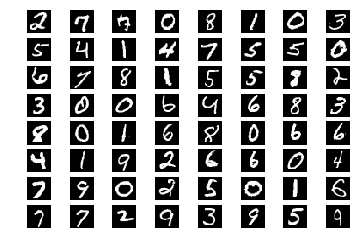

In [10]:
plotter(next(MNISTd)[0:64])

In [23]:
d = next(MNISTd)
d = d.reshape(-1,1,28,28)
# print(d.shape)
vis.images(d[0:45,:,:,:],
          opts=dict(title='Random!', caption='How random.'),)

'window_35ca4b20712fdc'

In [11]:
#pretraining
E = Encoder().cuda()
D = Decoder().cuda()
E = E.double()
D = D.double()
E.apply(wt_init)
D.apply(wt_init)
print(E)
print(D)

Encoder (
  (L1): Linear (784 -> 512)
  (Ou): Linear (512 -> 100)
  (L3): Linear (100 -> 100)
  (L4): Linear (100 -> 100)
)
Decoder (
  (L1): Linear (100 -> 512)
  (Ou): Linear (512 -> 784)
)


In [12]:
optim = tchoptim.Adam(list(E.parameters())+ list(D.parameters()), lr=1e-3)

In [13]:
def sample_z(mu, sig):
    e = Variable(tch.randn(BATCHSZ, e_out_dim).cuda().double())
    r = mu + (e*tch.exp(sig/2))
    return r
    

In [16]:
n_epoch = 100
n_iter = 100
n_generated_samples = 1000

randomly chosen 64 reconstruted samples after epoch: 0, itr: 0


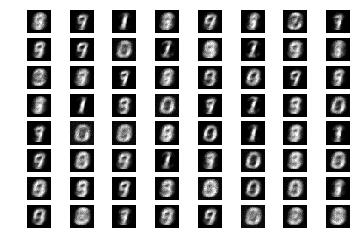

====> Epoch: 0 Average loss: 0.0442
########### generating samples after epoch 0 ###########


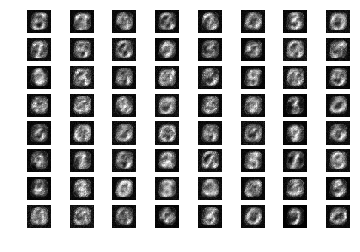

randomly chosen 64 reconstruted samples after epoch: 1, itr: 0


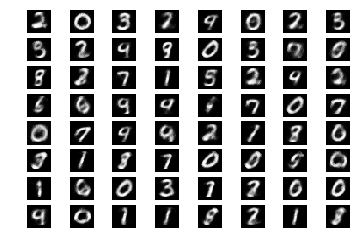

====> Epoch: 1 Average loss: 0.0321
########### generating samples after epoch 1 ###########


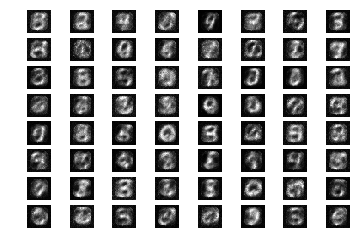

randomly chosen 64 reconstruted samples after epoch: 2, itr: 0


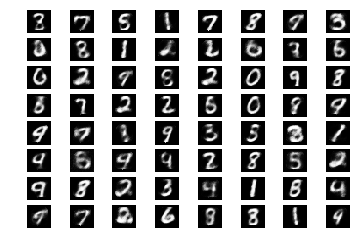

====> Epoch: 2 Average loss: 0.0260
########### generating samples after epoch 2 ###########


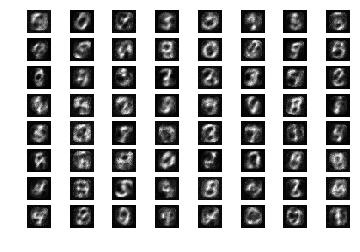

randomly chosen 64 reconstruted samples after epoch: 3, itr: 0


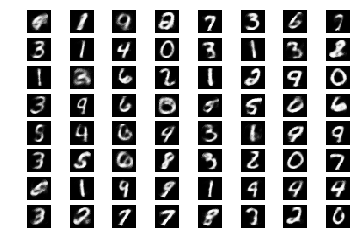

====> Epoch: 3 Average loss: 0.0223
########### generating samples after epoch 3 ###########


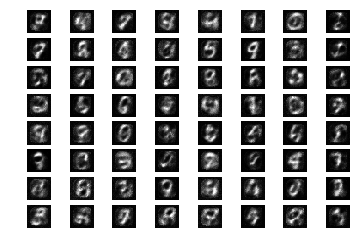

randomly chosen 64 reconstruted samples after epoch: 4, itr: 0


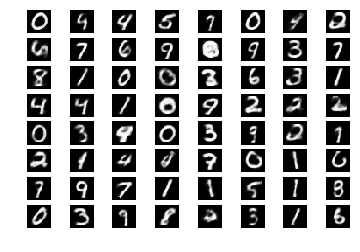

====> Epoch: 4 Average loss: 0.0197
########### generating samples after epoch 4 ###########


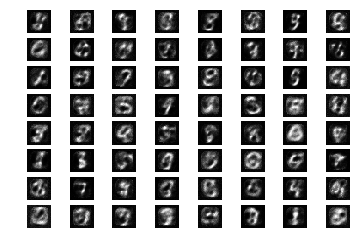

randomly chosen 64 reconstruted samples after epoch: 5, itr: 0


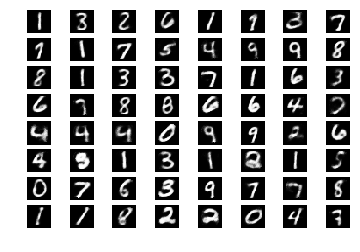

====> Epoch: 5 Average loss: 0.0177
########### generating samples after epoch 5 ###########


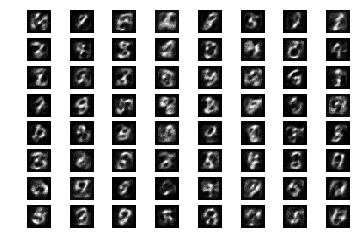

randomly chosen 64 reconstruted samples after epoch: 6, itr: 0


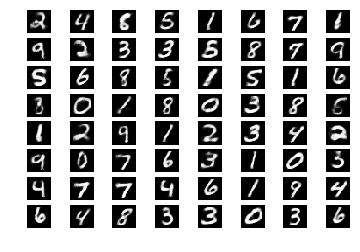

====> Epoch: 6 Average loss: 0.0162
########### generating samples after epoch 6 ###########


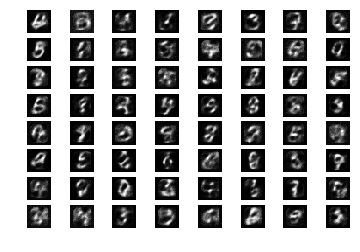

randomly chosen 64 reconstruted samples after epoch: 7, itr: 0


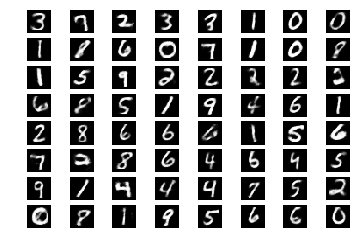

====> Epoch: 7 Average loss: 0.0150
########### generating samples after epoch 7 ###########


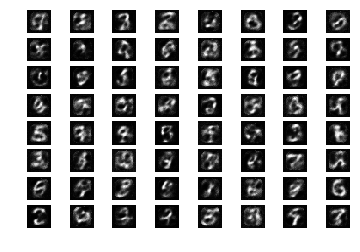

randomly chosen 64 reconstruted samples after epoch: 8, itr: 0


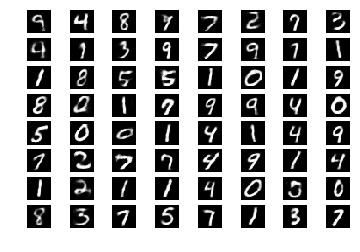

====> Epoch: 8 Average loss: 0.0141
########### generating samples after epoch 8 ###########


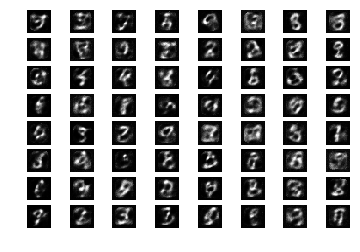

randomly chosen 64 reconstruted samples after epoch: 9, itr: 0


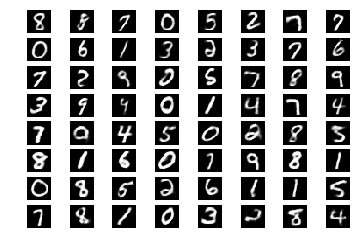

====> Epoch: 9 Average loss: 0.0136
########### generating samples after epoch 9 ###########


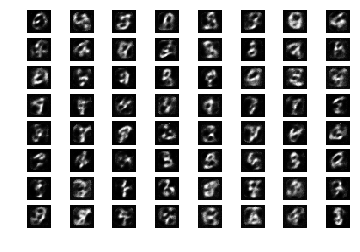

randomly chosen 64 reconstruted samples after epoch: 10, itr: 0


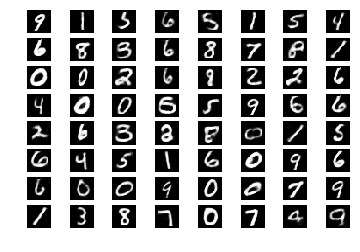

====> Epoch: 10 Average loss: 0.0130
########### generating samples after epoch 10 ###########


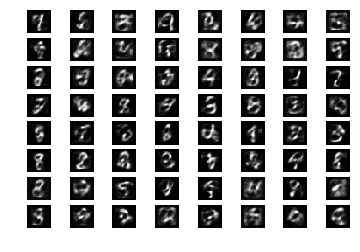

randomly chosen 64 reconstruted samples after epoch: 11, itr: 0


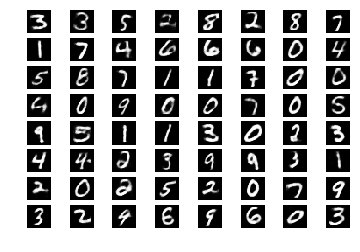

====> Epoch: 11 Average loss: 0.0125
########### generating samples after epoch 11 ###########


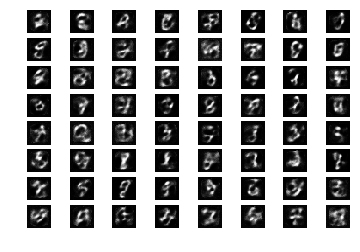

randomly chosen 64 reconstruted samples after epoch: 12, itr: 0


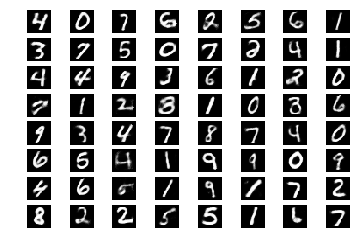

====> Epoch: 12 Average loss: 0.0120
########### generating samples after epoch 12 ###########


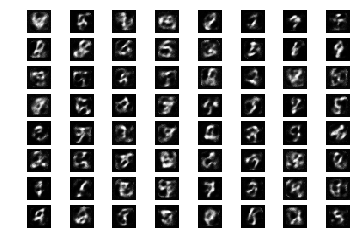

randomly chosen 64 reconstruted samples after epoch: 13, itr: 0


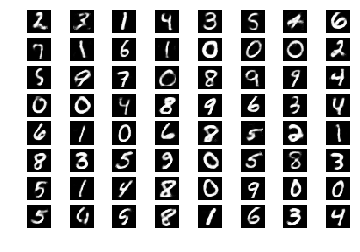

====> Epoch: 13 Average loss: 0.0115
########### generating samples after epoch 13 ###########


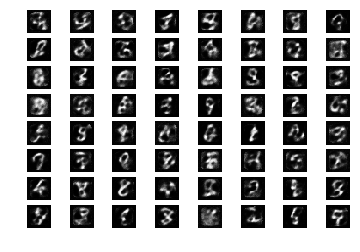

randomly chosen 64 reconstruted samples after epoch: 14, itr: 0


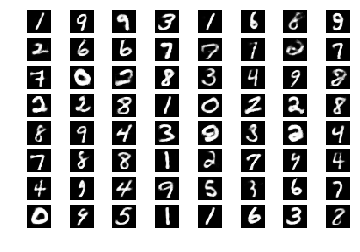

====> Epoch: 14 Average loss: 0.0112
########### generating samples after epoch 14 ###########


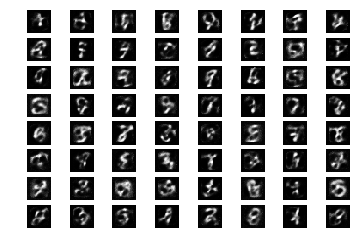

randomly chosen 64 reconstruted samples after epoch: 15, itr: 0


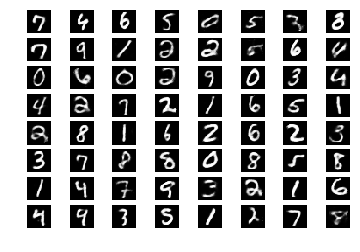

====> Epoch: 15 Average loss: 0.0109
########### generating samples after epoch 15 ###########


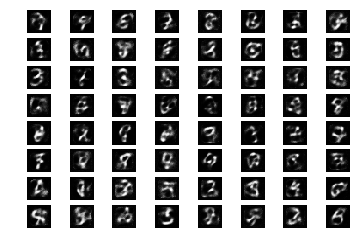

randomly chosen 64 reconstruted samples after epoch: 16, itr: 0


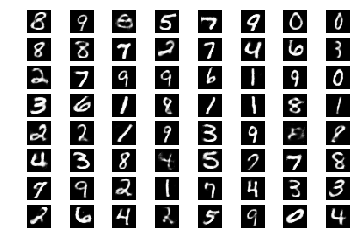

====> Epoch: 16 Average loss: 0.0107
########### generating samples after epoch 16 ###########


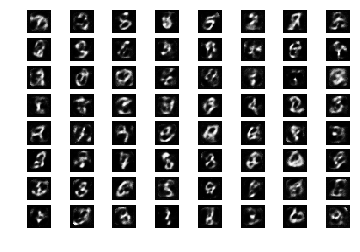

randomly chosen 64 reconstruted samples after epoch: 17, itr: 0


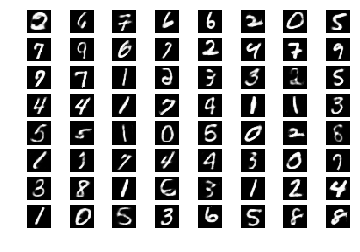

====> Epoch: 17 Average loss: 0.0104
########### generating samples after epoch 17 ###########


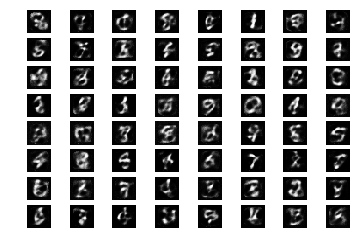

randomly chosen 64 reconstruted samples after epoch: 18, itr: 0


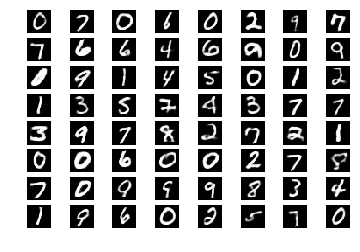

====> Epoch: 18 Average loss: 0.0102
########### generating samples after epoch 18 ###########


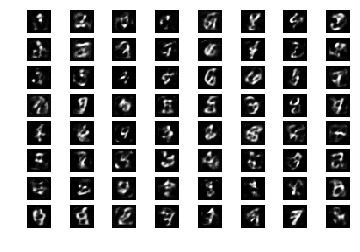

randomly chosen 64 reconstruted samples after epoch: 19, itr: 0


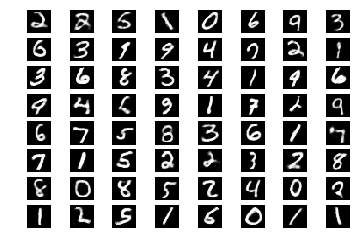

====> Epoch: 19 Average loss: 0.0100
########### generating samples after epoch 19 ###########


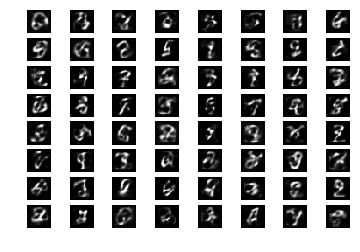

randomly chosen 64 reconstruted samples after epoch: 20, itr: 0


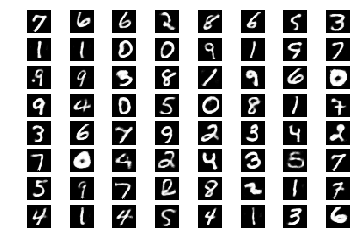

====> Epoch: 20 Average loss: 0.0097
########### generating samples after epoch 20 ###########


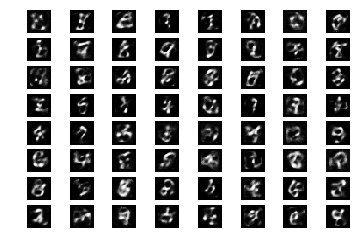

randomly chosen 64 reconstruted samples after epoch: 21, itr: 0


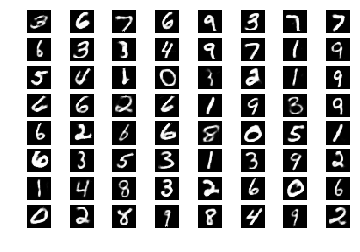

====> Epoch: 21 Average loss: 0.0095
########### generating samples after epoch 21 ###########


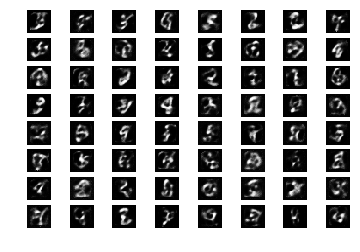

randomly chosen 64 reconstruted samples after epoch: 22, itr: 0


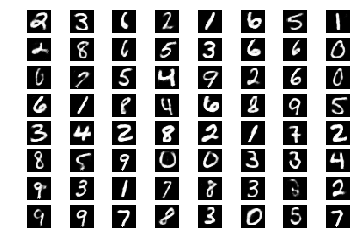

====> Epoch: 22 Average loss: 0.0093
########### generating samples after epoch 22 ###########


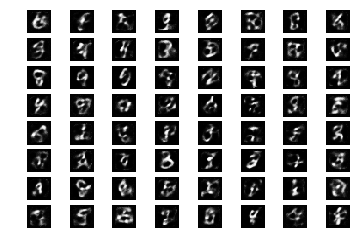

randomly chosen 64 reconstruted samples after epoch: 23, itr: 0


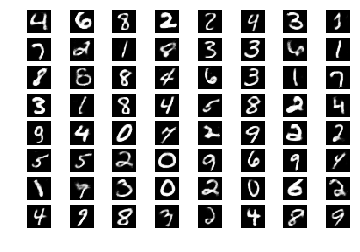

====> Epoch: 23 Average loss: 0.0093
########### generating samples after epoch 23 ###########


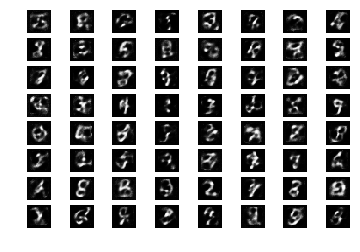

randomly chosen 64 reconstruted samples after epoch: 24, itr: 0


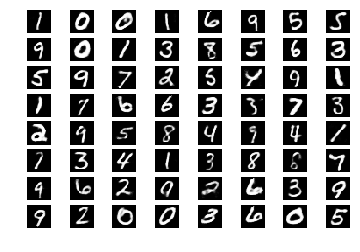

====> Epoch: 24 Average loss: 0.0091
########### generating samples after epoch 24 ###########


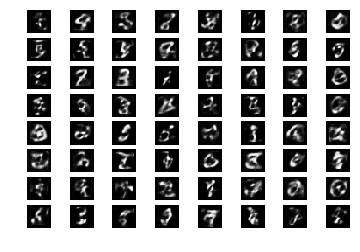

randomly chosen 64 reconstruted samples after epoch: 25, itr: 0


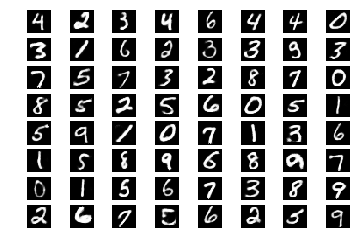

====> Epoch: 25 Average loss: 0.0090
########### generating samples after epoch 25 ###########


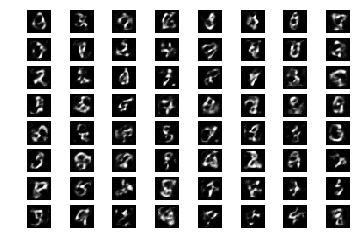

randomly chosen 64 reconstruted samples after epoch: 26, itr: 0


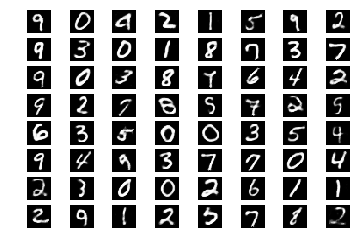

====> Epoch: 26 Average loss: 0.0088
########### generating samples after epoch 26 ###########


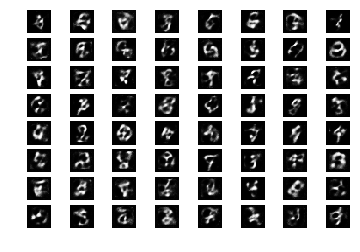

randomly chosen 64 reconstruted samples after epoch: 27, itr: 0


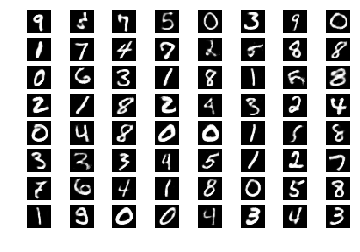

====> Epoch: 27 Average loss: 0.0087
########### generating samples after epoch 27 ###########


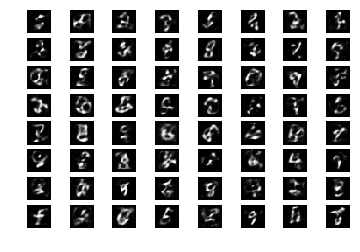

randomly chosen 64 reconstruted samples after epoch: 28, itr: 0


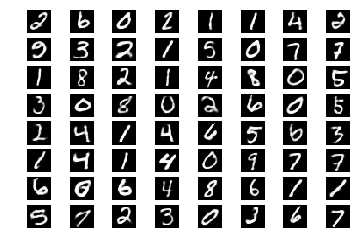

====> Epoch: 28 Average loss: 0.0085
########### generating samples after epoch 28 ###########


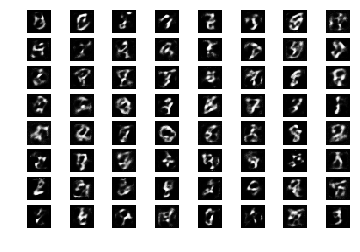

randomly chosen 64 reconstruted samples after epoch: 29, itr: 0


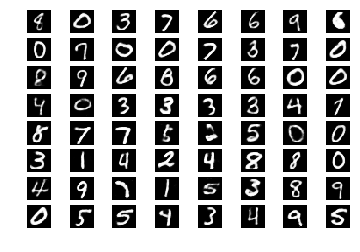

====> Epoch: 29 Average loss: 0.0085
########### generating samples after epoch 29 ###########


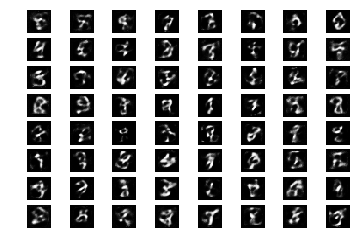

randomly chosen 64 reconstruted samples after epoch: 30, itr: 0


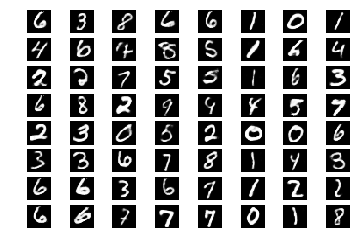

====> Epoch: 30 Average loss: 0.0083
########### generating samples after epoch 30 ###########


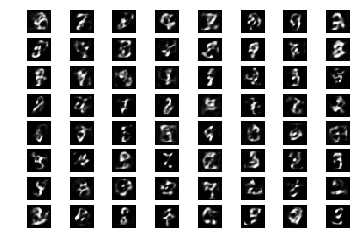

randomly chosen 64 reconstruted samples after epoch: 31, itr: 0


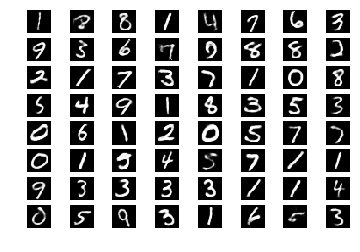

====> Epoch: 31 Average loss: 0.0083
########### generating samples after epoch 31 ###########


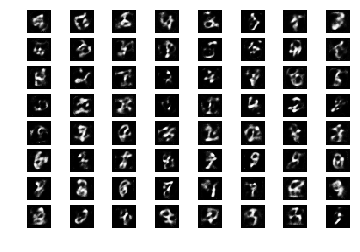

randomly chosen 64 reconstruted samples after epoch: 32, itr: 0


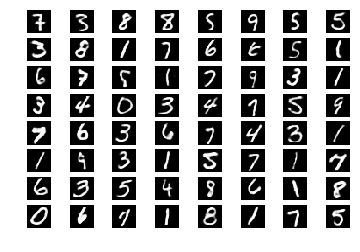

====> Epoch: 32 Average loss: 0.0082
########### generating samples after epoch 32 ###########


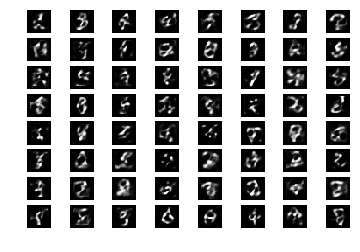

randomly chosen 64 reconstruted samples after epoch: 33, itr: 0


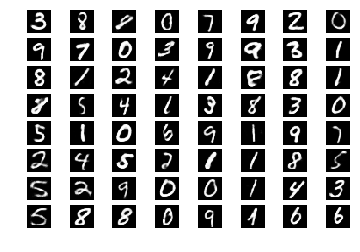

====> Epoch: 33 Average loss: 0.0081
########### generating samples after epoch 33 ###########


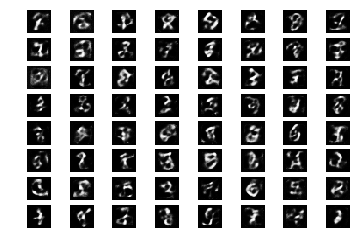

randomly chosen 64 reconstruted samples after epoch: 34, itr: 0


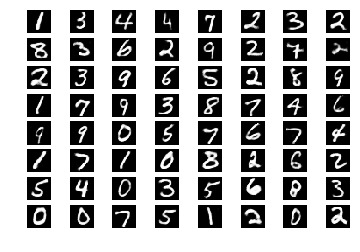

====> Epoch: 34 Average loss: 0.0080
########### generating samples after epoch 34 ###########


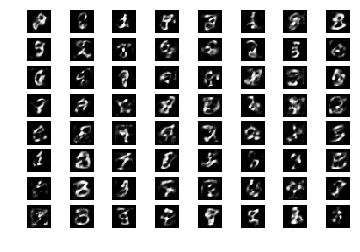

randomly chosen 64 reconstruted samples after epoch: 35, itr: 0


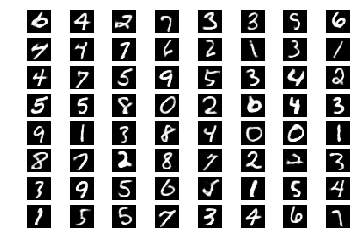

====> Epoch: 35 Average loss: 0.0079
########### generating samples after epoch 35 ###########


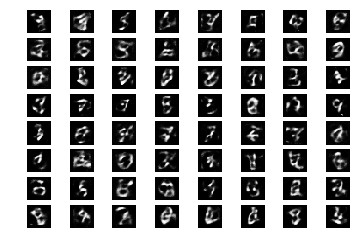

randomly chosen 64 reconstruted samples after epoch: 36, itr: 0


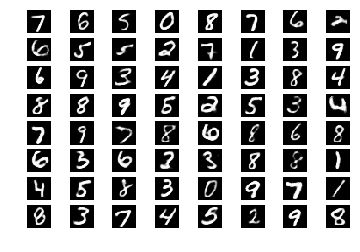

====> Epoch: 36 Average loss: 0.0078
########### generating samples after epoch 36 ###########


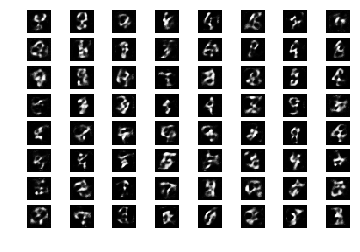

randomly chosen 64 reconstruted samples after epoch: 37, itr: 0


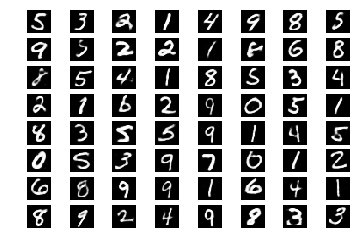

====> Epoch: 37 Average loss: 0.0078
########### generating samples after epoch 37 ###########


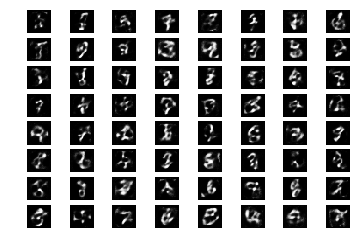

randomly chosen 64 reconstruted samples after epoch: 38, itr: 0


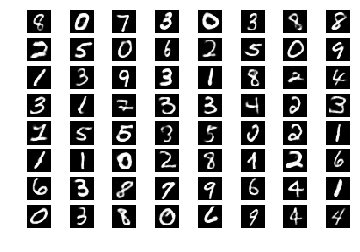

====> Epoch: 38 Average loss: 0.0077
########### generating samples after epoch 38 ###########


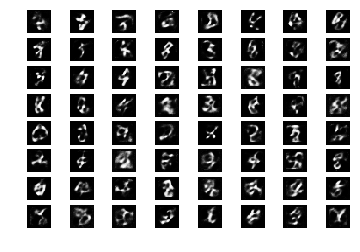

randomly chosen 64 reconstruted samples after epoch: 39, itr: 0


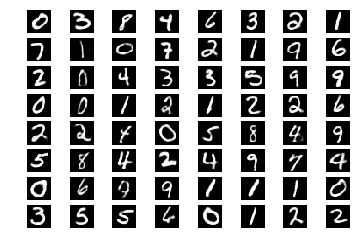

====> Epoch: 39 Average loss: 0.0076
########### generating samples after epoch 39 ###########


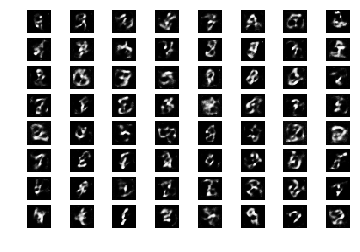

randomly chosen 64 reconstruted samples after epoch: 40, itr: 0


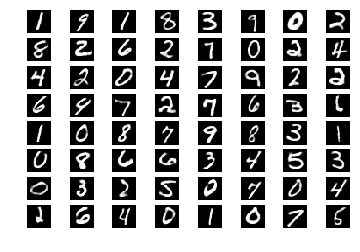

====> Epoch: 40 Average loss: 0.0075
########### generating samples after epoch 40 ###########


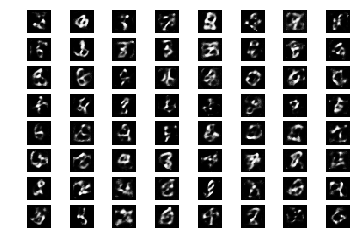

randomly chosen 64 reconstruted samples after epoch: 41, itr: 0


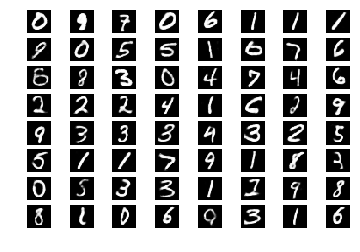

====> Epoch: 41 Average loss: 0.0075
########### generating samples after epoch 41 ###########


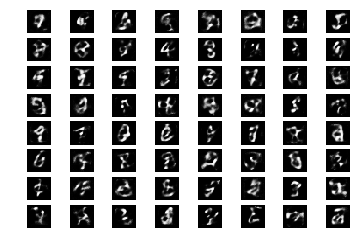

randomly chosen 64 reconstruted samples after epoch: 42, itr: 0


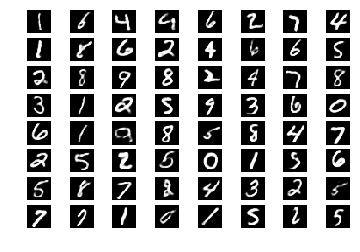

====> Epoch: 42 Average loss: 0.0074
########### generating samples after epoch 42 ###########


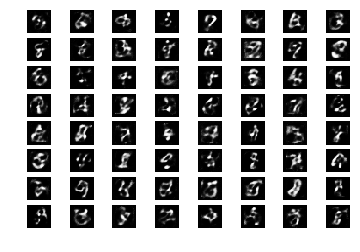

randomly chosen 64 reconstruted samples after epoch: 43, itr: 0


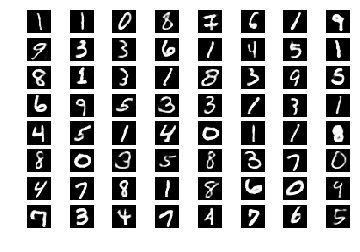

====> Epoch: 43 Average loss: 0.0074
########### generating samples after epoch 43 ###########


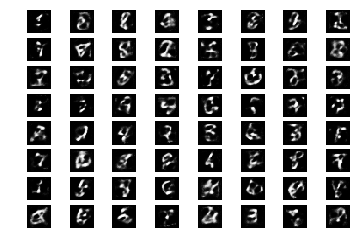

randomly chosen 64 reconstruted samples after epoch: 44, itr: 0


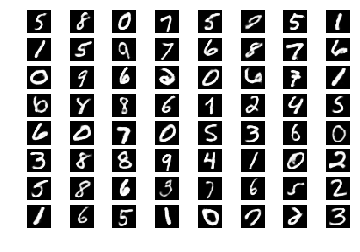

====> Epoch: 44 Average loss: 0.0073
########### generating samples after epoch 44 ###########


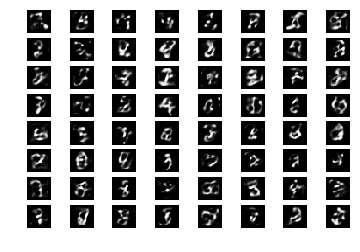

randomly chosen 64 reconstruted samples after epoch: 45, itr: 0


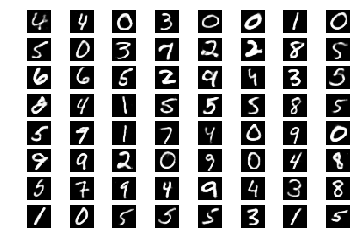

====> Epoch: 45 Average loss: 0.0072
########### generating samples after epoch 45 ###########


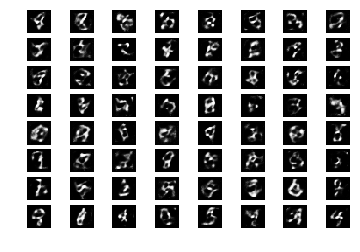

randomly chosen 64 reconstruted samples after epoch: 46, itr: 0


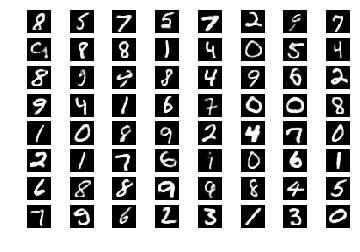

====> Epoch: 46 Average loss: 0.0072
########### generating samples after epoch 46 ###########


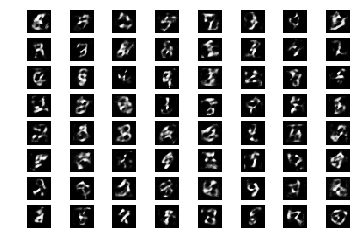

randomly chosen 64 reconstruted samples after epoch: 47, itr: 0


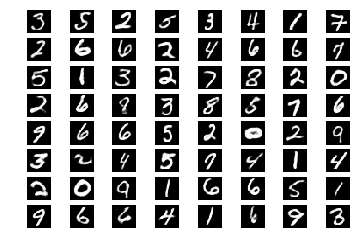

====> Epoch: 47 Average loss: 0.0071
########### generating samples after epoch 47 ###########


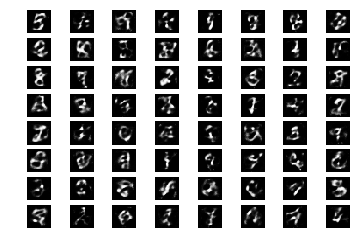

randomly chosen 64 reconstruted samples after epoch: 48, itr: 0


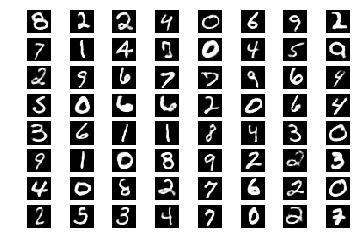

====> Epoch: 48 Average loss: 0.0071
########### generating samples after epoch 48 ###########


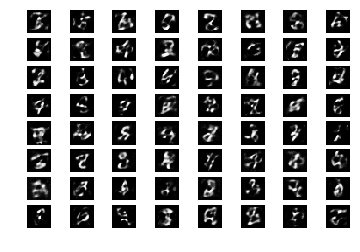

randomly chosen 64 reconstruted samples after epoch: 49, itr: 0


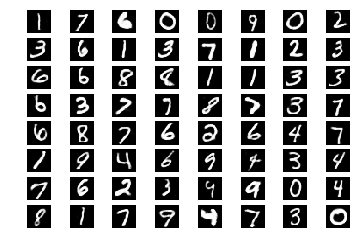

====> Epoch: 49 Average loss: 0.0070
########### generating samples after epoch 49 ###########


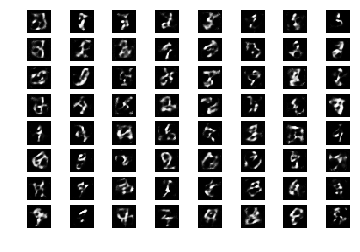

randomly chosen 64 reconstruted samples after epoch: 50, itr: 0


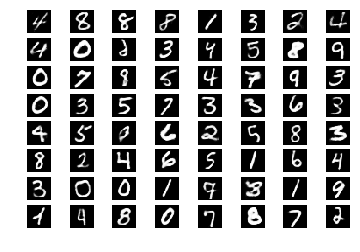

====> Epoch: 50 Average loss: 0.0070
########### generating samples after epoch 50 ###########


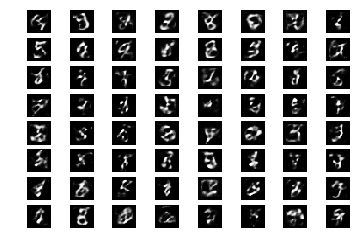

randomly chosen 64 reconstruted samples after epoch: 51, itr: 0


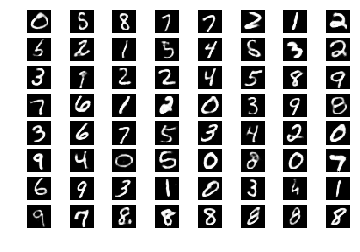

====> Epoch: 51 Average loss: 0.0069
########### generating samples after epoch 51 ###########


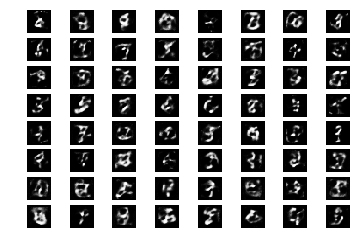

randomly chosen 64 reconstruted samples after epoch: 52, itr: 0


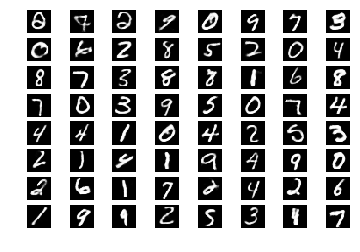

====> Epoch: 52 Average loss: 0.0069
########### generating samples after epoch 52 ###########


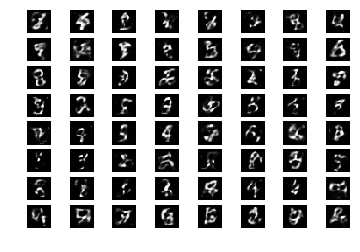

randomly chosen 64 reconstruted samples after epoch: 53, itr: 0


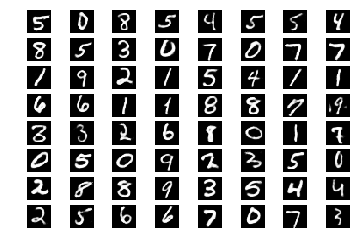

====> Epoch: 53 Average loss: 0.0069
########### generating samples after epoch 53 ###########


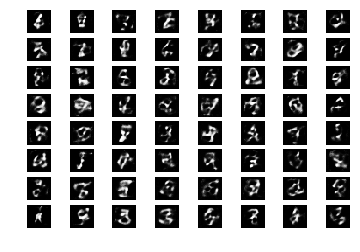

randomly chosen 64 reconstruted samples after epoch: 54, itr: 0


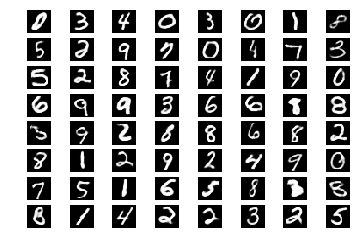

====> Epoch: 54 Average loss: 0.0068
########### generating samples after epoch 54 ###########


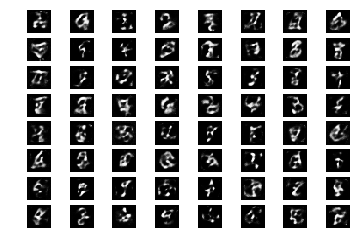

randomly chosen 64 reconstruted samples after epoch: 55, itr: 0


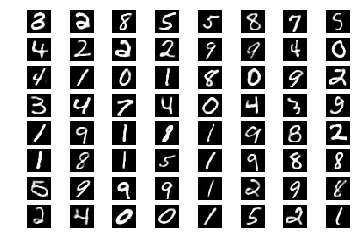

====> Epoch: 55 Average loss: 0.0067
########### generating samples after epoch 55 ###########


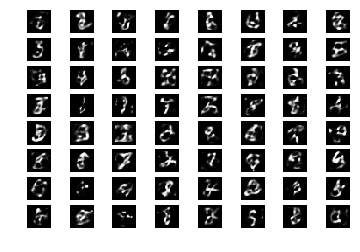

randomly chosen 64 reconstruted samples after epoch: 56, itr: 0


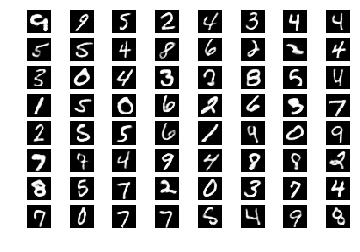

====> Epoch: 56 Average loss: 0.0066
########### generating samples after epoch 56 ###########


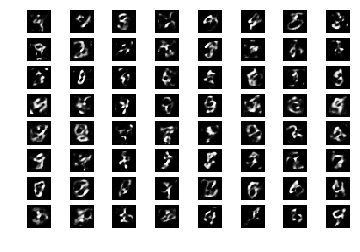

randomly chosen 64 reconstruted samples after epoch: 57, itr: 0


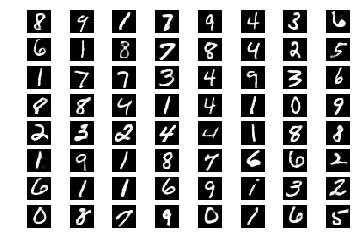

====> Epoch: 57 Average loss: 0.0067
########### generating samples after epoch 57 ###########


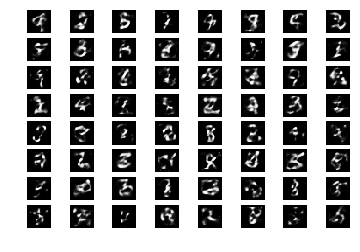

randomly chosen 64 reconstruted samples after epoch: 58, itr: 0


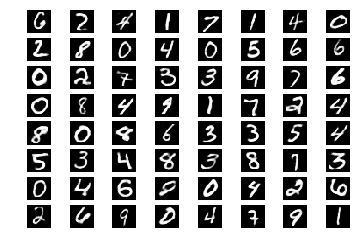

====> Epoch: 58 Average loss: 0.0066
########### generating samples after epoch 58 ###########


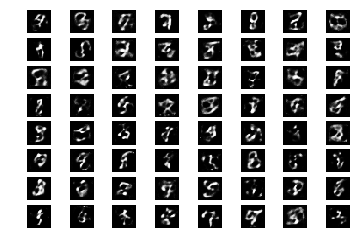

randomly chosen 64 reconstruted samples after epoch: 59, itr: 0


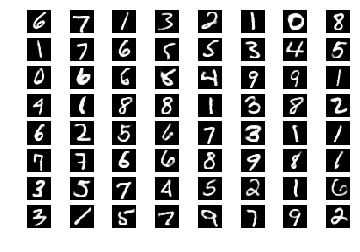

====> Epoch: 59 Average loss: 0.0065
########### generating samples after epoch 59 ###########


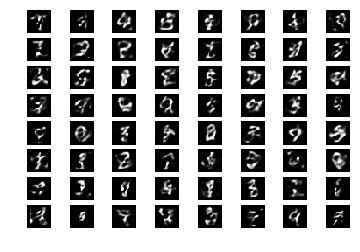

randomly chosen 64 reconstruted samples after epoch: 60, itr: 0


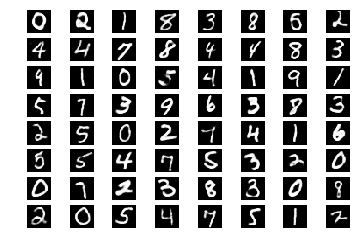

====> Epoch: 60 Average loss: 0.0065
########### generating samples after epoch 60 ###########


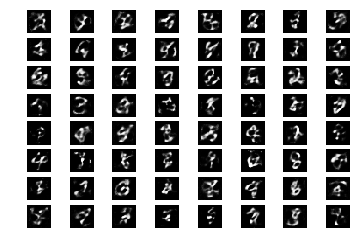

randomly chosen 64 reconstruted samples after epoch: 61, itr: 0


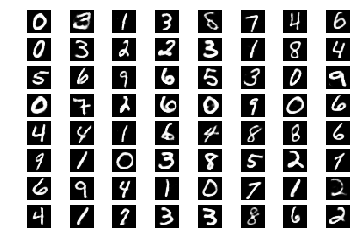

====> Epoch: 61 Average loss: 0.0065
########### generating samples after epoch 61 ###########


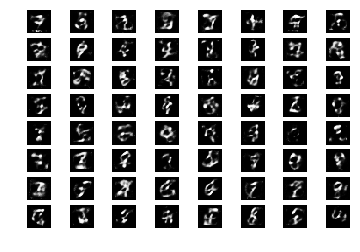

randomly chosen 64 reconstruted samples after epoch: 62, itr: 0


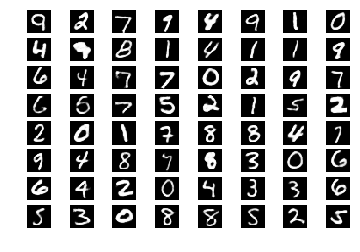

====> Epoch: 62 Average loss: 0.0064
########### generating samples after epoch 62 ###########


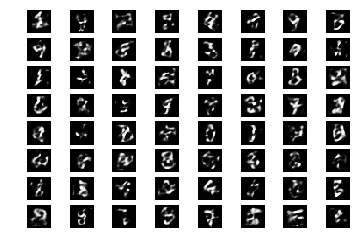

randomly chosen 64 reconstruted samples after epoch: 63, itr: 0


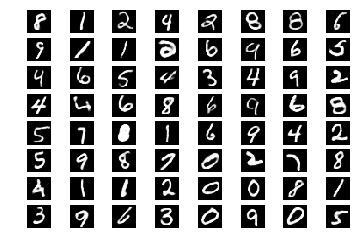

====> Epoch: 63 Average loss: 0.0064
########### generating samples after epoch 63 ###########


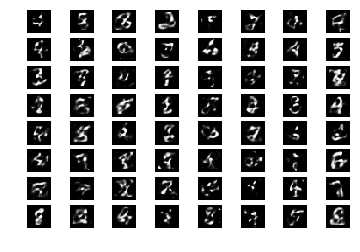

randomly chosen 64 reconstruted samples after epoch: 64, itr: 0


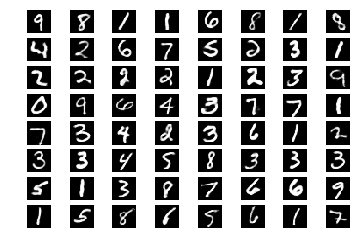

====> Epoch: 64 Average loss: 0.0063
########### generating samples after epoch 64 ###########


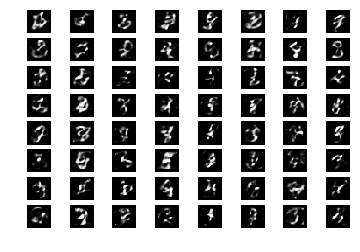

randomly chosen 64 reconstruted samples after epoch: 65, itr: 0


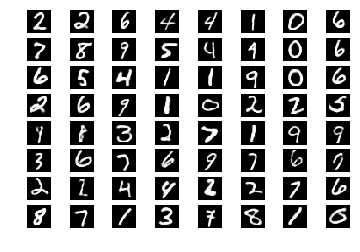

====> Epoch: 65 Average loss: 0.0063
########### generating samples after epoch 65 ###########


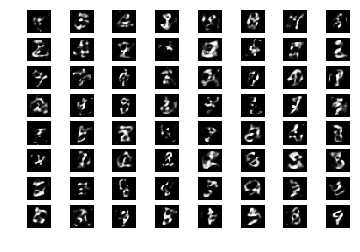

randomly chosen 64 reconstruted samples after epoch: 66, itr: 0


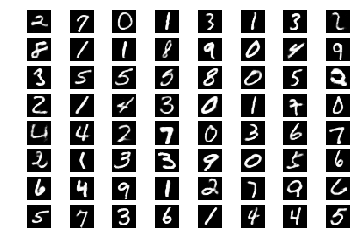

====> Epoch: 66 Average loss: 0.0063
########### generating samples after epoch 66 ###########


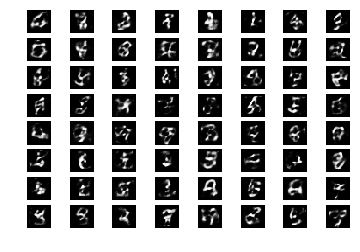

randomly chosen 64 reconstruted samples after epoch: 67, itr: 0


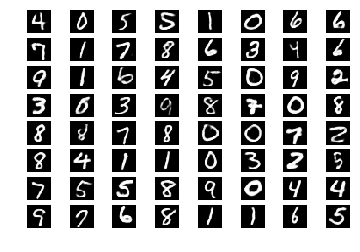

====> Epoch: 67 Average loss: 0.0063
########### generating samples after epoch 67 ###########


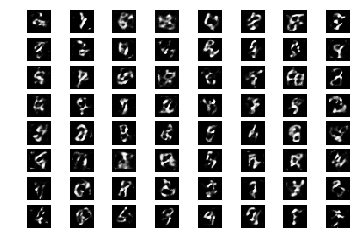

randomly chosen 64 reconstruted samples after epoch: 68, itr: 0


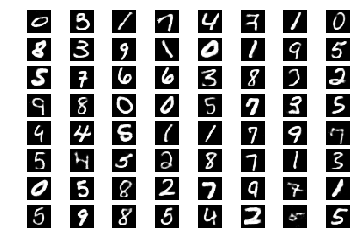

====> Epoch: 68 Average loss: 0.0062
########### generating samples after epoch 68 ###########


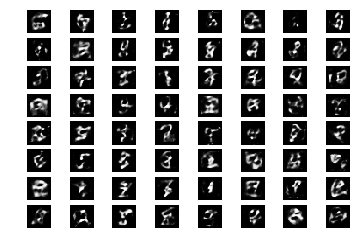

randomly chosen 64 reconstruted samples after epoch: 69, itr: 0


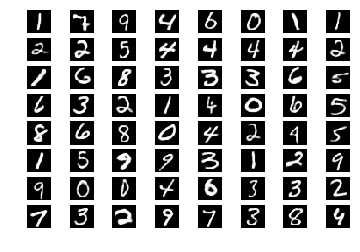

====> Epoch: 69 Average loss: 0.0062
########### generating samples after epoch 69 ###########


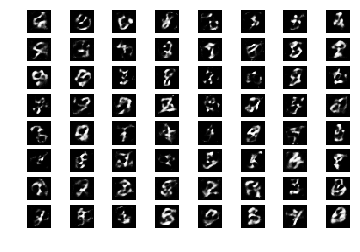

randomly chosen 64 reconstruted samples after epoch: 70, itr: 0


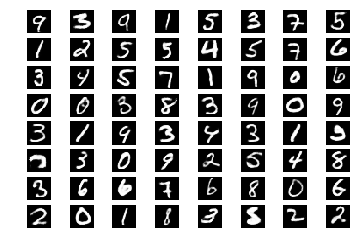

====> Epoch: 70 Average loss: 0.0062
########### generating samples after epoch 70 ###########


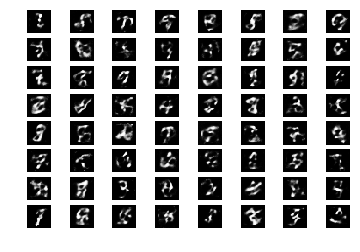

randomly chosen 64 reconstruted samples after epoch: 71, itr: 0


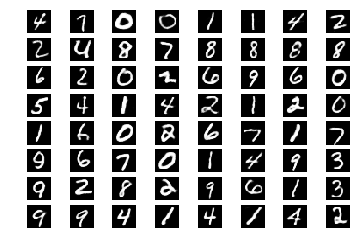

====> Epoch: 71 Average loss: 0.0061
########### generating samples after epoch 71 ###########


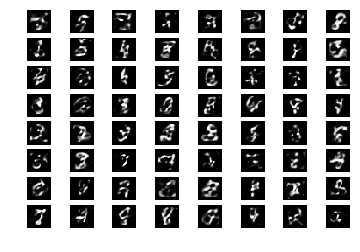

randomly chosen 64 reconstruted samples after epoch: 72, itr: 0


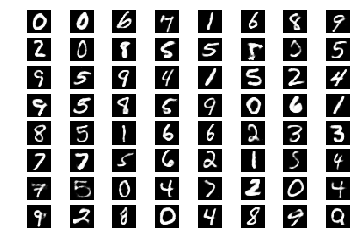

====> Epoch: 72 Average loss: 0.0061
########### generating samples after epoch 72 ###########


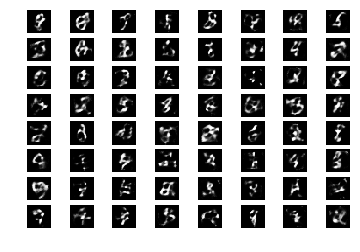

randomly chosen 64 reconstruted samples after epoch: 73, itr: 0


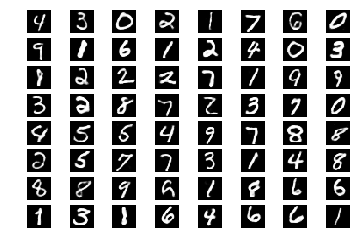

====> Epoch: 73 Average loss: 0.0060
########### generating samples after epoch 73 ###########


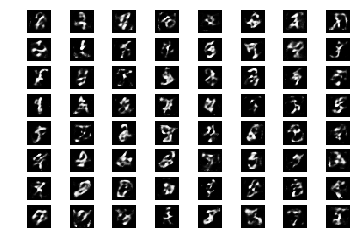

randomly chosen 64 reconstruted samples after epoch: 74, itr: 0


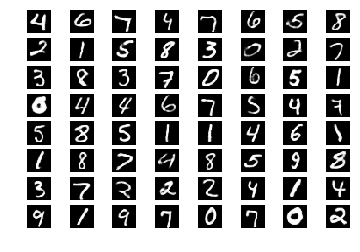

====> Epoch: 74 Average loss: 0.0060
########### generating samples after epoch 74 ###########


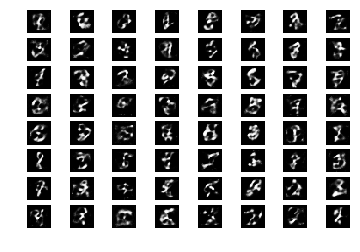

randomly chosen 64 reconstruted samples after epoch: 75, itr: 0


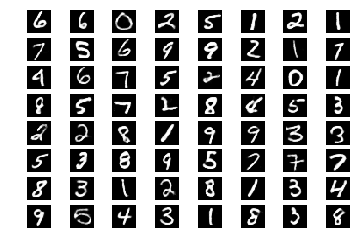

====> Epoch: 75 Average loss: 0.0060
########### generating samples after epoch 75 ###########


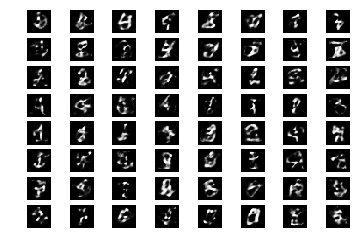

randomly chosen 64 reconstruted samples after epoch: 76, itr: 0


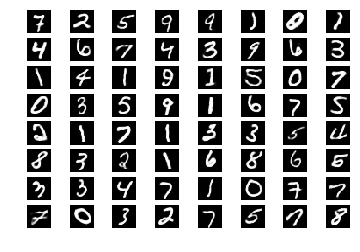

====> Epoch: 76 Average loss: 0.0060
########### generating samples after epoch 76 ###########


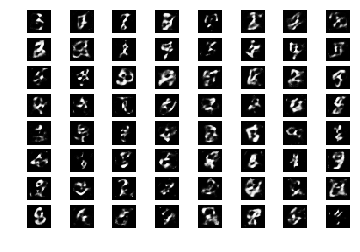

randomly chosen 64 reconstruted samples after epoch: 77, itr: 0


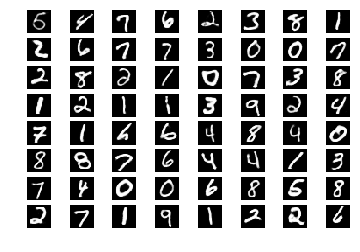

====> Epoch: 77 Average loss: 0.0060
########### generating samples after epoch 77 ###########


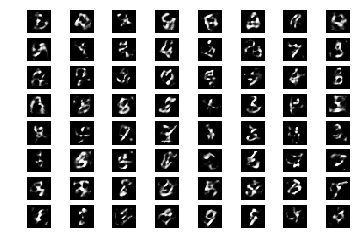

randomly chosen 64 reconstruted samples after epoch: 78, itr: 0


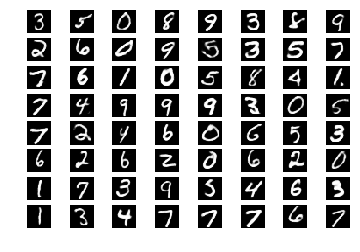

====> Epoch: 78 Average loss: 0.0059
########### generating samples after epoch 78 ###########


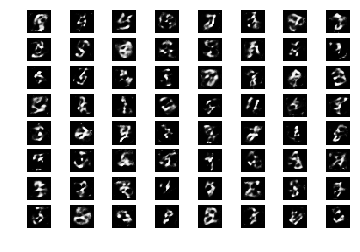

randomly chosen 64 reconstruted samples after epoch: 79, itr: 0


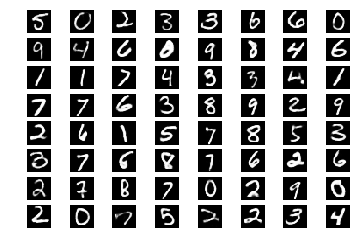

====> Epoch: 79 Average loss: 0.0059
########### generating samples after epoch 79 ###########


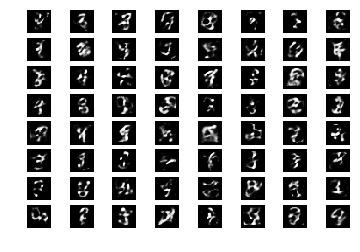

randomly chosen 64 reconstruted samples after epoch: 80, itr: 0


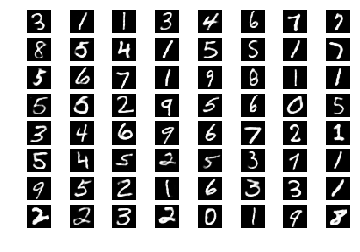

====> Epoch: 80 Average loss: 0.0058
########### generating samples after epoch 80 ###########


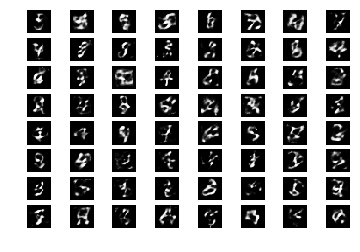

randomly chosen 64 reconstruted samples after epoch: 81, itr: 0


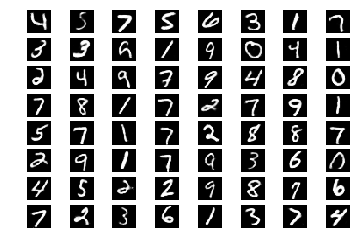

====> Epoch: 81 Average loss: 0.0058
########### generating samples after epoch 81 ###########


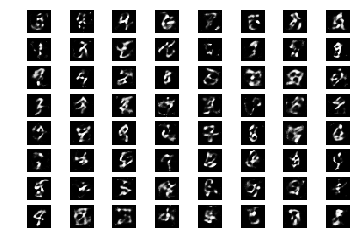

randomly chosen 64 reconstruted samples after epoch: 82, itr: 0


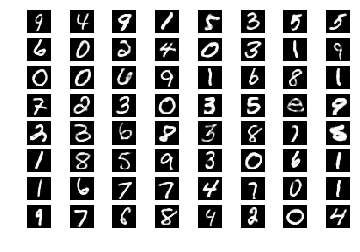

====> Epoch: 82 Average loss: 0.0058
########### generating samples after epoch 82 ###########


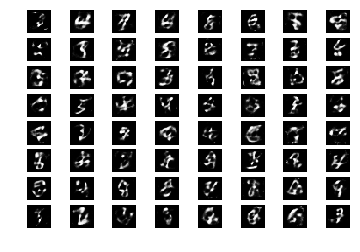

randomly chosen 64 reconstruted samples after epoch: 83, itr: 0


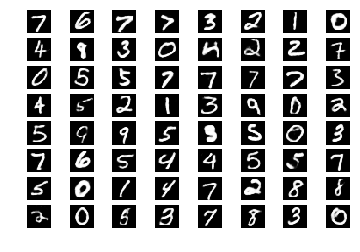

====> Epoch: 83 Average loss: 0.0058
########### generating samples after epoch 83 ###########


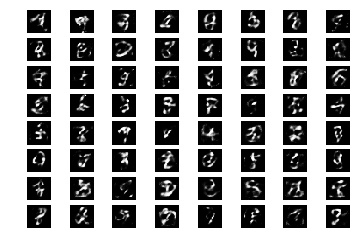

randomly chosen 64 reconstruted samples after epoch: 84, itr: 0


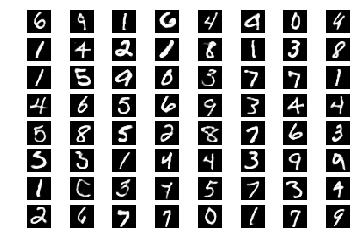

====> Epoch: 84 Average loss: 0.0058
########### generating samples after epoch 84 ###########


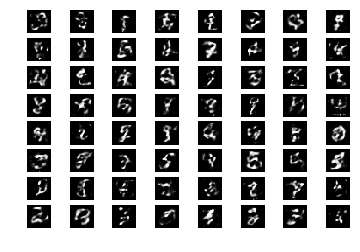

randomly chosen 64 reconstruted samples after epoch: 85, itr: 0


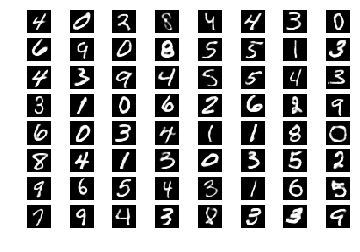

====> Epoch: 85 Average loss: 0.0057
########### generating samples after epoch 85 ###########


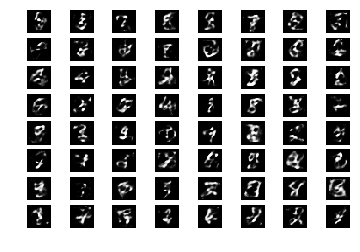

randomly chosen 64 reconstruted samples after epoch: 86, itr: 0


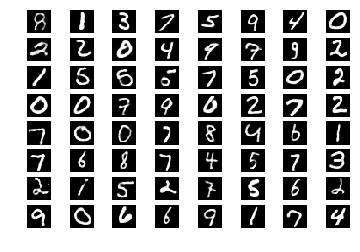

====> Epoch: 86 Average loss: 0.0057
########### generating samples after epoch 86 ###########


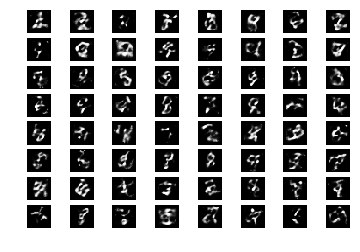

randomly chosen 64 reconstruted samples after epoch: 87, itr: 0


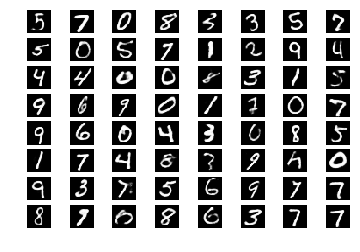

====> Epoch: 87 Average loss: 0.0057
########### generating samples after epoch 87 ###########


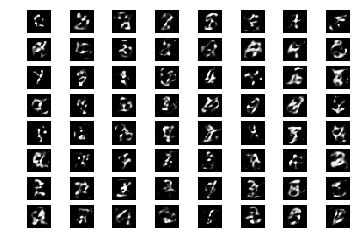

randomly chosen 64 reconstruted samples after epoch: 88, itr: 0


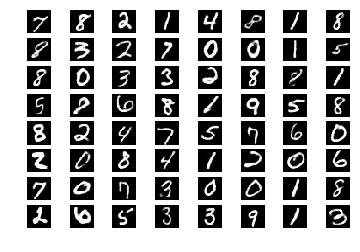

====> Epoch: 88 Average loss: 0.0056
########### generating samples after epoch 88 ###########


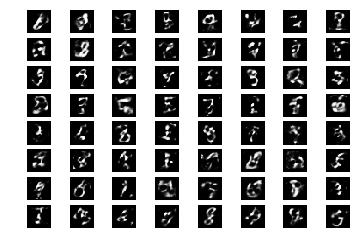

randomly chosen 64 reconstruted samples after epoch: 89, itr: 0


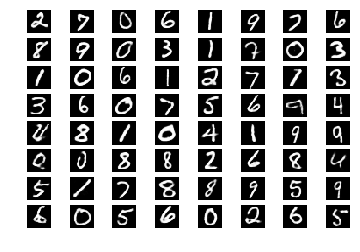

====> Epoch: 89 Average loss: 0.0056
########### generating samples after epoch 89 ###########


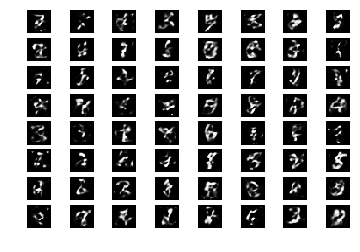

randomly chosen 64 reconstruted samples after epoch: 90, itr: 0


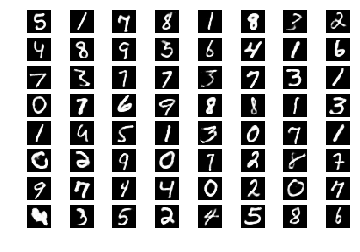

====> Epoch: 90 Average loss: 0.0056
########### generating samples after epoch 90 ###########


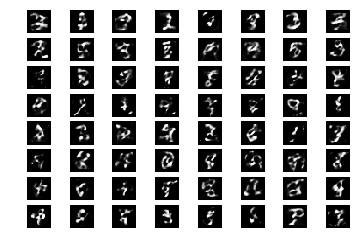

randomly chosen 64 reconstruted samples after epoch: 91, itr: 0


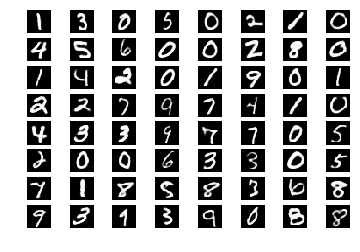

====> Epoch: 91 Average loss: 0.0056
########### generating samples after epoch 91 ###########


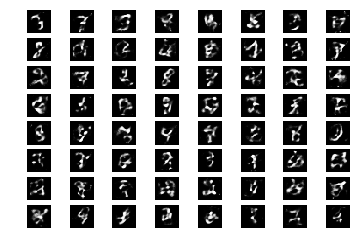

randomly chosen 64 reconstruted samples after epoch: 92, itr: 0


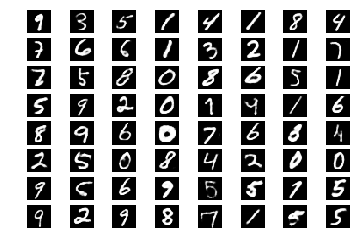

====> Epoch: 92 Average loss: 0.0056
########### generating samples after epoch 92 ###########


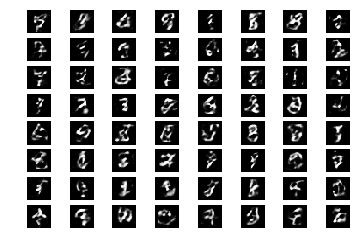

randomly chosen 64 reconstruted samples after epoch: 93, itr: 0


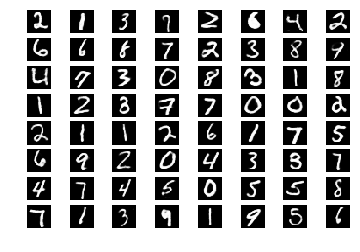

====> Epoch: 93 Average loss: 0.0055
########### generating samples after epoch 93 ###########


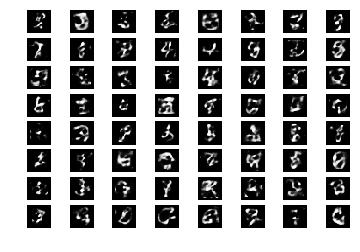

randomly chosen 64 reconstruted samples after epoch: 94, itr: 0


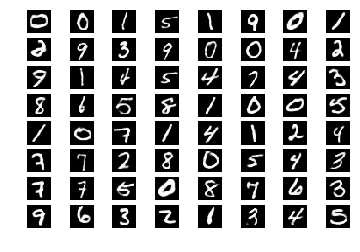

====> Epoch: 94 Average loss: 0.0055
########### generating samples after epoch 94 ###########


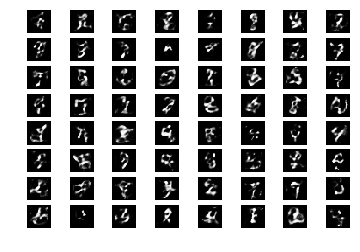

randomly chosen 64 reconstruted samples after epoch: 95, itr: 0


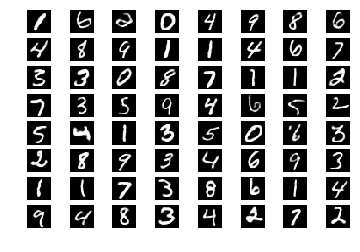

====> Epoch: 95 Average loss: 0.0055
########### generating samples after epoch 95 ###########


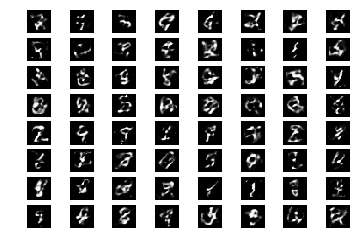

randomly chosen 64 reconstruted samples after epoch: 96, itr: 0


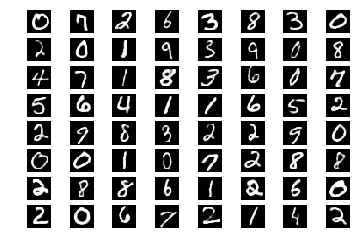

====> Epoch: 96 Average loss: 0.0055
########### generating samples after epoch 96 ###########


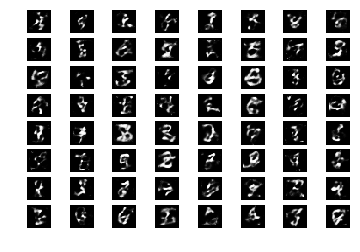

randomly chosen 64 reconstruted samples after epoch: 97, itr: 0


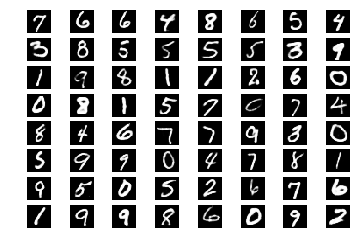

====> Epoch: 97 Average loss: 0.0055
########### generating samples after epoch 97 ###########


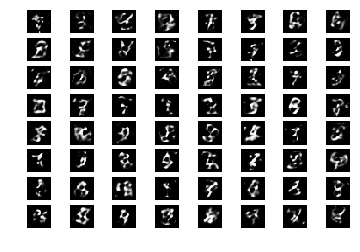

randomly chosen 64 reconstruted samples after epoch: 98, itr: 0


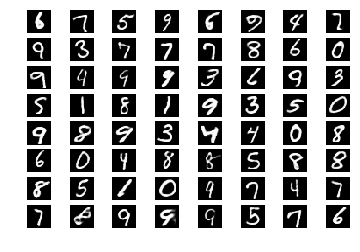

====> Epoch: 98 Average loss: 0.0054
########### generating samples after epoch 98 ###########


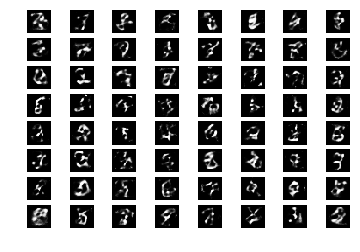

randomly chosen 64 reconstruted samples after epoch: 99, itr: 0


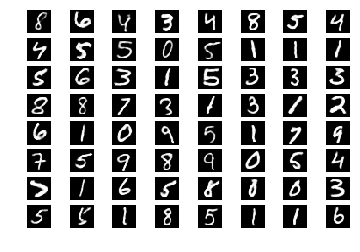

====> Epoch: 99 Average loss: 0.0054
########### generating samples after epoch 99 ###########


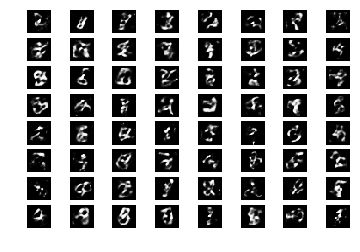

In [17]:
#training
for eph in range(n_epoch):
    training_loss = 0
    for itr in range(n_iter):
        #print('dbg1')
        X = next(MNISTd)
        X = Variable(tch.from_numpy(X).cuda())
        #through the encoder
        E.zero_grad()
        #print('X shape: {}'.format(X.size()))
        z_mu, z_log_sig = E(X)
        #print('z_mu shape, z_log_sig shape: {}, {}'.format(z_mu.size(), z_log_sig.size()))
        z = sample_z(z_mu, z_log_sig)
        #print('z shape: {}'.format(z.size()))
        #through the decoder
        z = z.cuda()
        D.zero_grad()
        d_out = D(z)
        #loss
        recon_loss = F.mse_loss(d_out, X)
        KL_div = tch.mean(0.5 * tch.sum(tch.exp(z_log_sig) + z_mu**2 - 1. - z_log_sig, 1))
        KL_div /= BATCHSZ*28*28 # <- learnt a lesson, constansdo matter, kind of like units
        loss = recon_loss + KL_div
        training_loss += loss

        loss.backward()
        optim.step()

        #print results sometimes
        if itr%100 == 0:
            print('randomly chosen 64 reconstruted samples after epoch: {}, itr: {}'.format(eph,itr))
            d = d_out.data.cpu().numpy()
            d = d.reshape(-1,1,28,28)
            d1 = list(d)
            d1 = random.sample(d1, 64)
            d = np.array(d1)
            plotter(d)
    print('====> Epoch: {} Average loss: {:.4f}'.format(eph, training_loss.data.cpu().numpy()[0]/n_iter))
    #generation after this epoch
    print('########### generating samples after epoch {} ###########'.format(eph))
    z_test = tch.randn(n_generated_samples,d_inp_dim)
    z_test = Variable(z_test.view(-1, d_inp_dim).double().cuda())
    #print('ztest shape: {}'.format(z_test.size()))
    y = D(z_test)
    #print('y size: {}'.format(y.size()))
    y = y.data.cpu().numpy().reshape(-1,1,28,28)
    y1 = list(y)
    y1 = random.sample(y1, 64)
    y = np.array(y1)
    plotter(y)
    #to save the model after this epoch (path w.r.t to server)
    tch.save(E.state_dict(), './models/E_epoch{}.pth'.format(eph))
    tch.save(D.state_dict(), './models/D_epoch{}.pth'.format(eph))
    